<a href="https://colab.research.google.com/github/Guava001/Fake_News_Detection/blob/main/Fake_News.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
import numpy as np
import pandas as pd
import re
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
from wordcloud import WordCloud
import warnings
warnings.filterwarnings('ignore')

In [5]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout,Embedding,LSTM,Conv1D,MaxPool1D
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,accuracy_score,confusion_matrix,roc_auc_score

In [6]:
fake = pd.read_csv('https://raw.githubusercontent.com/laxmimerit/fake-real-news-dataset/refs/heads/main/data/Fake.csv')

In [7]:
fake

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"
...,...,...,...,...
23476,McPain: John McCain Furious That Iran Treated ...,21st Century Wire says As 21WIRE reported earl...,Middle-east,"January 16, 2016"
23477,JUSTICE? Yahoo Settles E-mail Privacy Class-ac...,21st Century Wire says It s a familiar theme. ...,Middle-east,"January 16, 2016"
23478,Sunnistan: US and Allied ‘Safe Zone’ Plan to T...,Patrick Henningsen 21st Century WireRemember ...,Middle-east,"January 15, 2016"
23479,How to Blow $700 Million: Al Jazeera America F...,21st Century Wire says Al Jazeera America will...,Middle-east,"January 14, 2016"


In [8]:
fake.columns

Index(['title', 'text', 'subject', 'date'], dtype='object')

In [9]:
fake['subject'].value_counts()

,count
subject,
News,9050
politics,6841
left-news,4459
Government News,1570
US_News,783
Middle-east,778


<Axes: xlabel='subject', ylabel='count'>

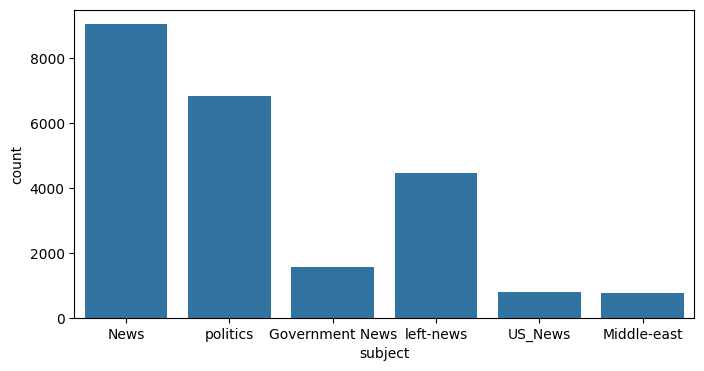

In [10]:
plt.figure(figsize=(8,4))
sns.countplot(x = 'subject' ,data=fake)

In [11]:
text = ' '.join(fake['text'].tolist())

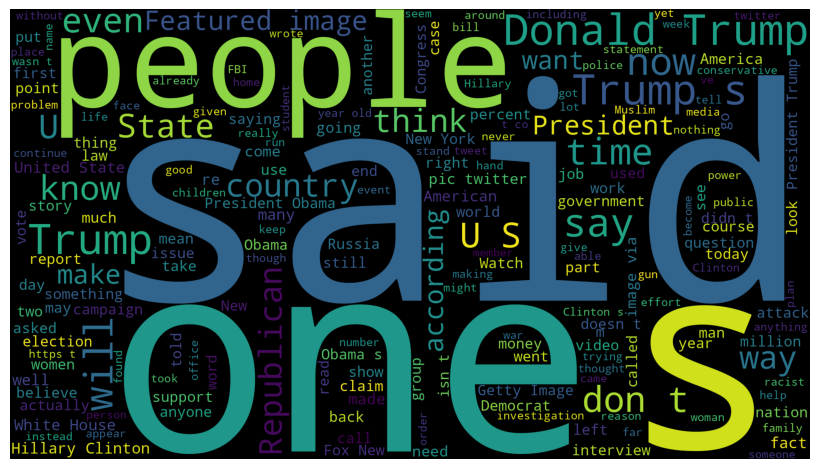

In [12]:
wordcloud = WordCloud(width=1920,height=1080).generate(text)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [13]:
real = pd.read_csv('https://raw.githubusercontent.com/laxmimerit/fake-real-news-dataset/refs/heads/main/data/True.csv')

In [14]:
text = ' '.join(real['text'].tolist())

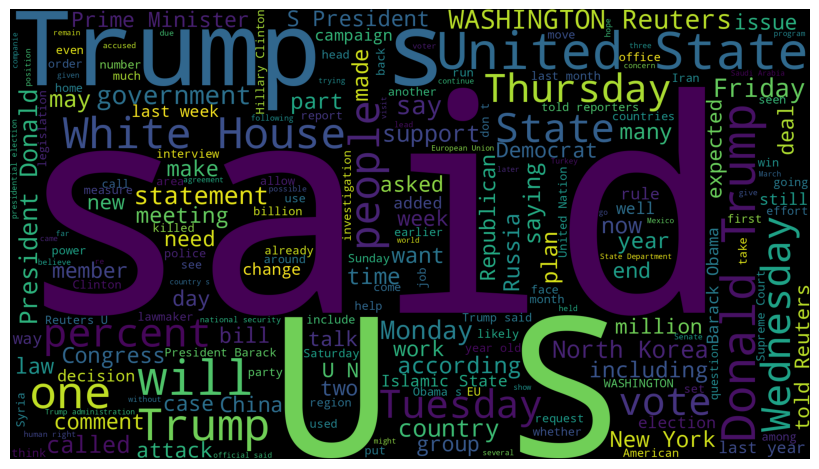

In [15]:
wordcloud = WordCloud(width=1920,height=1080).generate(text)
plt.figure(figsize=(8,8))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [16]:
real.sample(5)

,title,text,subject,date
1277,"Canada, Mexico vow to stick with NAFTA talks, ...",MEXICO CITY (Reuters) - The leaders of Mexico ...,politicsNews,"October 12, 2017"
5823,Fired: Trump dumps top lawyer who defied immig...,"(In this Jan. 30 story, corrects spelling of ...",politicsNews,"January 30, 2017"
18692,Only 'miracles' can move Brexit talks forward ...,TALLINN (Reuters) - Only miracles can move B...,worldnews,"September 29, 2017"
15576,Iran says Saudi Arabia facing results of its '...,DUBAI (Reuters) - Iranian Foreign Minister Moh...,worldnews,"November 6, 2017"
14900,Australia to introduce safeguards against cove...,SYDNEY (Reuters) - Australia said on Tuesday i...,worldnews,"November 14, 2017"


In [17]:
unknown_publisher = []
for index, row in enumerate(real.text.values):
  try:
    record = row.split('-',maxsplit=1)
    record[1]

    assert (len(record[0])<120)
  except:
    unknown_publisher.append(index)

In [18]:
len(unknown_publisher)

222

In [19]:
real.iloc[unknown_publisher].text

,text
7,The following statements were posted to the ve...
8,The following statements were posted to the ve...
12,The following statements were posted to the ve...
13,The following statements were posted to the ve...
14,"(In Dec. 25 story, in second paragraph, corre..."
...,...
20135,(Story corrects to million from billion in pa...
20500,"(This Sept 8 story corrects headline, clarifi..."
20667,"(Story refiles to add dropped word not , in ..."
21246,(Story corrects third paragraph to show Mosul...


In [20]:
real.iloc[8970]

,8970
title,Graphic: Supreme Court roundup
text,
subject,politicsNews
date,"June 16, 2016"


In [21]:
real = real.drop(8970, axis=0)

In [22]:
publisher = []
tmp_text = []

for index, row in enumerate(real.text.values):
  if index  in unknown_publisher:
    tmp_text.append(row)
    publisher.append('Unknown')

  else:
    record = row.split('-',maxsplit=1)
    publisher.append(record[0].strip())
    tmp_text.append(record[1].strip())

In [23]:
real['publisher'] = publisher
real['text'] = tmp_text

In [24]:
real.head()

,title,text,subject,date,publisher
0,"As U.S. budget fight looms, Republicans flip t...",The head of a conservative Republican faction ...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
1,U.S. military to accept transgender recruits o...,Transgender people will be allowed for the fir...,politicsNews,"December 29, 2017",WASHINGTON (Reuters)
2,Senior U.S. Republican senator: 'Let Mr. Muell...,The special counsel investigation of links bet...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
3,FBI Russia probe helped by Australian diplomat...,Trump campaign adviser George Papadopoulos tol...,politicsNews,"December 30, 2017",WASHINGTON (Reuters)
4,Trump wants Postal Service to charge 'much mor...,President Donald Trump called on the U.S. Post...,politicsNews,"December 29, 2017",SEATTLE/WASHINGTON (Reuters)


In [25]:
real.shape

(21416, 5)

In [26]:
empty_fake_index = [index for index,text in enumerate (fake.text.tolist()) if str(text).strip()=="" ]

In [27]:
fake.iloc[empty_fake_index]

,title,text,subject,date
10923,TAKE OUR POLL: Who Do You Think President Trum...,,politics,"May 10, 2017"
11041,Joe Scarborough BERATES Mika Brzezinski Over “...,,politics,"Apr 26, 2017"
11190,WATCH TUCKER CARLSON Scorch Sanctuary City May...,,politics,"Apr 6, 2017"
11225,MAYOR OF SANCTUARY CITY: Trump Trying To Make ...,,politics,"Apr 2, 2017"
11236,SHOCKER: Public School Turns Computer Lab Into...,,politics,"Apr 1, 2017"
...,...,...,...,...
21816,BALTIMORE BURNS: MARYLAND GOVERNOR BRINGS IN N...,,left-news,"Apr 27, 2015"
21826,FULL VIDEO: THE BLOCKBUSTER INVESTIGATION INTO...,,left-news,"Apr 25, 2015"
21827,(VIDEO) HILLARY CLINTON: RELIGIOUS BELIEFS MUS...,,left-news,"Apr 25, 2015"
21857,(VIDEO)ICE PROTECTING OBAMA: WON’T RELEASE NAM...,,left-news,"Apr 14, 2015"


In [28]:
real['text'] = real['title'] +" "+ real['text']
fake['text'] = fake['title'] +" "+ fake['text']

In [29]:
real['text'] = real['text'].apply(lambda x: str(x).lower())
fake['text'] = fake['text'].apply(lambda x: str(x).lower())

In [30]:
real['text']

,text
0,"as u.s. budget fight looms, republicans flip t..."
1,u.s. military to accept transgender recruits o...
2,senior u.s. republican senator: 'let mr. muell...
3,fbi russia probe helped by australian diplomat...
4,trump wants postal service to charge 'much mor...
...,...
21412,'fully committed' nato backs new u.s. approach...
21413,lexisnexis withdrew two products from chinese ...
21414,minsk cultural hub becomes haven from authorit...
21415,vatican upbeat on possibility of pope francis ...


In [31]:
real['class'] = 1
fake['class'] = 0

In [32]:
real.columns

Index(['title', 'text', 'subject', 'date', 'publisher', 'class'], dtype='object')

In [33]:
real = real[['text','class']]
fake = fake[['text','class']]

In [34]:
data = pd.concat([real, fake], ignore_index=True)

In [35]:
data.sample(5)

,text,class
11293,"in first remarks since retweet feud, uae diplo...",1
27484,richest man in the world puts trump in his pl...,0
41790,obama’s new and “improved” fbi offers huge rew...,0
28208,ted cruz pulls the last trick from his hat an...,0
31752,ned ryun on white house leaks: “this is not wh...,0


In [36]:
!pip install spacy==3.7.6
!python -m spacy download en_core_web_sm==3.7.1
!pip install nltk==3.9.1
!pip install beautifulsoup4==3.2.2
!pip install textblob==0.18.0.post0
!pip install googletrans==3.1.0a0
!pip install git+https://github.com/laxmimerit/preprocess_kgptalkie.git --upgrade --force-reinstall

Reason for being yanked: Incorrect compatibility for transformer models
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.0/29.0 MB 73.1 MB/s eta 0:00:00
  Attempting uninstall: spacy
    Found existing installation: spacy 3.7.5
    Uninstalling spacy-3.7.5:
      Successfully uninstalled spacy-3.7.5

✘ No compatible package found for 'en_core_web_sm==3.7.1' (spaCy
v3.7.6)

ERROR: Could not find a version that satisfies the requirement beautifulsoup4==3.2.2 (from versions: 4.0.1, 4.0.2, 4.0.3, 4.0.4, 4.0.5, 4.1.0, 4.1.1, 4.1.2, 4.1.3, 4.2.0, 4.2.1, 4.3.0, 4.3.1, 4.3.2, 4.4.0, 4.4.1, 4.5.0, 4.5.1, 4.5.2, 4.5.3, 4.6.0, 4.6.1, 4.6.2, 4.6.3, 4.7.0, 4.7.1, 4.8.0, 4.8.1, 4.8.2, 4.9.0, 4.9.1, 4.9.2, 4.9.3, 4.10.0, 4.11.0, 4.11.1, 4.11.2, 4.12.0, 4.12.1, 4.12.2, 4.12.3, 4.13.0b2, 4.13.0b3)
ERROR: No matching distribution found for beautifulsoup4==3.2.2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 626.3/626.3 kB 12.4 MB/s eta 0:00:00
  Attempting uninstall: textblob
    Found existing installation:

  Cloning https://github.com/laxmimerit/preprocess_kgptalkie.git to /tmp/pip-req-build-72sfz42w
  Running command git clone --filter=blob:none --quiet https://github.com/laxmimerit/preprocess_kgptalkie.git /tmp/pip-req-build-72sfz42w
  Resolved https://github.com/laxmimerit/preprocess_kgptalkie.git to commit 0f56a6502679f6750b7f0ffed98f590d1f0246bd
  Preparing metadata (setup.py) ... done
  Created wheel for preprocess_kgptalkie: filename=preprocess_kgptalkie-0.11-py3-none-any.whl size=8175 sha256=b3fe8a5d2ffe103d53158b36b96615a0793e5e82e9cb9791aa7bdeaf751ca893
  Stored in directory: /tmp/pip-ephem-wheel-cache-guc4g37s/wheels/5c/94/34/99d5ff65e88b8d9a6c5e8d8652f2311d87790a61a1b7466e21
Successfully built preprocess_kgptalkie


In [37]:
import spacy

# Load the spaCy English model
nlp = spacy.load("en_core_web_sm")

def clean_text_spacy(text):
    doc = nlp(text)
    # Keep only alphanumeric tokens (remove special characters, punctuations, etc.)
    tokens = [token.text for token in doc if token.is_alpha or token.is_digit]
    return ' '.join(tokens)

# Apply this function to the dataset
data['text'] = data['text'].apply(clean_text_spacy)


In [38]:
import gensim

In [39]:
y = data['class'].values

In [40]:
X = [d.split() for d in data['text'].tolist()]

In [41]:
type(X[0])

list

In [42]:
print(X[0])

['as', 'budget', 'fight', 'looms', 'republicans', 'flip', 'their', 'fiscal', 'script', 'the', 'head', 'of', 'a', 'conservative', 'republican', 'faction', 'in', 'the', 'congress', 'who', 'voted', 'this', 'month', 'for', 'a', 'huge', 'expansion', 'of', 'the', 'national', 'debt', 'to', 'pay', 'for', 'tax', 'cuts', 'called', 'himself', 'a', 'fiscal', 'conservative', 'on', 'sunday', 'and', 'urged', 'budget', 'restraint', 'in', '2018', 'in', 'keeping', 'with', 'a', 'sharp', 'pivot', 'under', 'way', 'among', 'republicans', 'representative', 'mark', 'meadows', 'speaking', 'on', 'cbs', 'face', 'the', 'nation', 'drew', 'a', 'hard', 'line', 'on', 'federal', 'spending', 'which', 'lawmakers', 'are', 'bracing', 'to', 'do', 'battle', 'over', 'in', 'january', 'when', 'they', 'return', 'from', 'the', 'holidays', 'on', 'wednesday', 'lawmakers', 'will', 'begin', 'trying', 'to', 'pass', 'a', 'federal', 'budget', 'in', 'a', 'fight', 'likely', 'to', 'be', 'linked', 'to', 'other', 'issues', 'such', 'as', 'im

In [43]:
DIM = 100
w2v_model = gensim.models.Word2Vec(sentences=X, vector_size=DIM, window=10, min_count=1)

In [44]:
len(w2v_model.wv.key_to_index)

98813

In [45]:
w2v_model.wv['love']

array([-0.5559063 ,  1.3757668 , -1.0755703 , -4.186206  ,  1.6020374 ,
        0.26606017, -1.4153097 , -2.9499006 , -0.32258987, -2.2358057 ,
       -1.037011  , -2.2866356 , -0.098389  , -0.32718557, -0.40492168,
        3.836481  ,  3.4390244 ,  4.176819  ,  2.2031412 , -1.2671158 ,
       -1.6349878 ,  3.6140068 , -0.82610273, -0.5117685 , -3.145107  ,
        3.38696   ,  0.49257734, -0.21316987,  2.3153396 , -2.4694571 ,
       -0.48040137, -0.9009477 , -2.1683788 ,  0.57929057, -3.1753895 ,
       -1.2167786 , -1.6167196 , -1.9552554 ,  1.3367107 , -2.3736956 ,
        3.1889431 ,  0.9699506 ,  0.05503027, -0.0352571 ,  0.7251373 ,
        3.5734148 , -4.3654323 , -3.150373  ,  1.644077  ,  2.6811047 ,
       -0.04075594,  1.3389919 ,  1.4978462 , -0.7515529 , -2.0818188 ,
       -0.7108655 , -2.5025582 ,  2.82241   ,  1.791903  , -2.0380123 ,
        2.7408059 , -3.2511368 , -2.336341  ,  0.64066285, -0.72877365,
        1.5384883 , -0.7200659 ,  2.3482473 ,  2.1795564 ,  1.38

In [46]:
w2v_model.wv.most_similar('love')

[('applaud', 0.7331152558326721),
 ('thank', 0.7020221948623657),
 ('wish', 0.6698256731033325),
 ('appreciate', 0.6679816246032715),
 ('pray', 0.6493918895721436),
 ('admire', 0.638506293296814),
 ('know', 0.626823365688324),
 ('beautiful', 0.6248317956924438),
 ('remind', 0.6163926124572754),
 ('suppose', 0.6045289635658264)]

In [47]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X)

In [48]:
X = tokenizer.texts_to_sequences(X)

In [49]:
X

[[18,
  486,
  500,
  10428,
  135,
  5626,
  39,
  1395,
  5002,
  1,
  419,
  3,
  4,
  302,
  74,
  6230,
  6,
  1,
  192,
  29,
  803,
  26,
  259,
  9,
  4,
  1140,
  2971,
  3,
  1,
  125,
  942,
  2,
  447,
  9,
  182,
  1207,
  155,
  406,
  4,
  1395,
  302,
  8,
  344,
  5,
  1143,
  486,
  7592,
  6,
  1193,
  6,
  1764,
  16,
  4,
  3339,
  7793,
  143,
  163,
  331,
  135,
  817,
  923,
  7676,
  650,
  8,
  1980,
  448,
  1,
  328,
  1785,
  4,
  513,
  557,
  8,
  173,
  709,
  49,
  421,
  28,
  16477,
  2,
  79,
  1357,
  66,
  6,
  417,
  58,
  31,
  805,
  25,
  1,
  7963,
  8,
  206,
  421,
  38,
  1458,
  364,
  2,
  879,
  4,
  173,
  486,
  6,
  4,
  500,
  315,
  2,
  23,
  1670,
  2,
  80,
  443,
  175,
  18,
  308,
  210,
  108,
  18,
  1,
  511,
  581,
  93,
  2080,
  1529,
  6,
  49,
  135,
  38,
  1107,
  2,
  396,
  345,
  3,
  192,
  35,
  70,
  12,
  5,
  19,
  135,
  185,
  4,
  381,
  486,
  986,
  6,
  168,
  709,
  113,
  199,
  61,
  185,
  11890,
 

In [50]:
tokenizer.word_index

{'the': 1,
 'to': 2,
 'of': 3,
 'a': 4,
 'and': 5,
 'in': 6,
 'that': 7,
 'on': 8,
 'for': 9,
 's': 10,
 'is': 11,
 'trump': 12,
 'he': 13,
 'it': 14,
 'said': 15,
 'with': 16,
 'was': 17,
 'as': 18,
 'his': 19,
 'by': 20,
 'has': 21,
 'not': 22,
 'be': 23,
 'have': 24,
 'from': 25,
 'this': 26,
 'at': 27,
 'are': 28,
 'who': 29,
 'an': 30,
 'they': 31,
 'i': 32,
 'we': 33,
 'but': 34,
 'president': 35,
 'would': 36,
 'about': 37,
 'will': 38,
 'their': 39,
 'you': 40,
 'had': 41,
 't': 42,
 'been': 43,
 'people': 44,
 'were': 45,
 'more': 46,
 'or': 47,
 'after': 48,
 'which': 49,
 'she': 50,
 'one': 51,
 'her': 52,
 'out': 53,
 'if': 54,
 'state': 55,
 'all': 56,
 'what': 57,
 'when': 58,
 'up': 59,
 'new': 60,
 'also': 61,
 'its': 62,
 'there': 63,
 'obama': 64,
 'no': 65,
 'over': 66,
 'can': 67,
 'clinton': 68,
 'house': 69,
 'donald': 70,
 'government': 71,
 'our': 72,
 'so': 73,
 'republican': 74,
 'states': 75,
 'just': 76,
 'him': 77,
 'than': 78,
 'do': 79,
 'other': 80,
 'ye

In [51]:
# Number of words in each row

[len(x) for x  in X]

[750,
 630,
 463,
 385,
 847,
 599,
 540,
 133,
 96,
 74,
 398,
 622,
 97,
 163,
 360,
 455,
 695,
 175,
 395,
 219,
 524,
 908,
 409,
 365,
 703,
 372,
 345,
 265,
 74,
 441,
 174,
 228,
 94,
 333,
 1105,
 835,
 555,
 471,
 467,
 98,
 172,
 327,
 580,
 70,
 410,
 363,
 613,
 353,
 83,
 401,
 81,
 966,
 669,
 418,
 402,
 379,
 223,
 163,
 390,
 611,
 487,
 243,
 852,
 373,
 624,
 650,
 1303,
 430,
 403,
 139,
 204,
 1048,
 74,
 76,
 602,
 850,
 749,
 793,
 347,
 696,
 481,
 420,
 83,
 416,
 127,
 1381,
 100,
 457,
 357,
 87,
 60,
 105,
 657,
 351,
 226,
 77,
 323,
 415,
 340,
 559,
 415,
 840,
 91,
 324,
 136,
 196,
 409,
 89,
 1121,
 932,
 389,
 112,
 74,
 432,
 600,
 86,
 77,
 636,
 254,
 255,
 315,
 200,
 157,
 285,
 392,
 426,
 401,
 717,
 620,
 282,
 103,
 89,
 81,
 74,
 73,
 504,
 405,
 244,
 720,
 770,
 226,
 420,
 430,
 538,
 421,
 367,
 308,
 821,
 693,
 89,
 99,
 107,
 360,
 86,
 56,
 295,
 224,
 283,
 377,
 107,
 460,
 576,
 942,
 1070,
 258,
 457,
 458,
 500,
 89,
 535,
 19

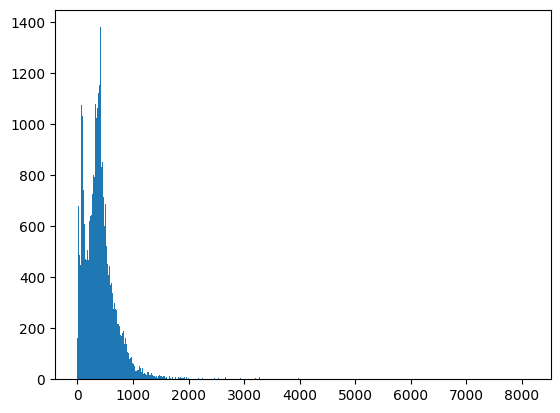

In [52]:
plt.hist([len(x) for x  in X],bins=700)
plt.show()

In [53]:
nos = np.array([len(x) for x  in X])
len(nos[nos>1000])

1573

In [54]:
maxlen = 1000
X = pad_sequences(X,maxlen=maxlen)

In [55]:
len(X[101])

1000

In [56]:
vocab_size = len(tokenizer.word_index) + 1
vocab = tokenizer.word_index

In [57]:
def get_weight_matrix(model):
  weight_matrix = np.zeros((vocab_size,DIM))

  for word, i in vocab.items():
    weight_matrix[i] = model.wv[word]

  return weight_matrix

In [58]:
vocab_size

98814

In [59]:
embedding_vectors = get_weight_matrix(w2v_model)

In [60]:
embedding_vectors.shape

(98814, 100)

In [61]:
print(f"vocab_size: {vocab_size}, DIM: {DIM}, maxlen: {maxlen}")
print(f"embedding_vectors shape: {embedding_vectors.shape}")

vocab_size: 98814, DIM: 100, maxlen: 1000
embedding_vectors shape: (98814, 100)


In [62]:
model = Sequential()
model.add(Embedding(vocab_size, output_dim=DIM, weights=[embedding_vectors],
                    input_shape=(maxlen,), trainable=False))
model.add(LSTM(units=128, input_shape=(maxlen, DIM)))
model.add(Dropout(0.5))
model.add(Dense(units=64,activation='relu'))
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])

In [63]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding (Embedding)                │ (None, 1000, 100)           │       9,881,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 128)                 │         117,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,006,969 (38.17 MB)

 Trainable params: 125,569 (490.50 KB)

 Non-trainable params: 9,881,400 (37.69 MB)

In [64]:
X_train,X_test,y_train,y_test = train_test_split(X,y)

In [65]:
model.fit(X_train,y_train,validation_split=0.3,epochs=6)

Epoch 1/6
737/737 ━━━━━━━━━━━━━━━━━━━━ 37s 41ms/step - acc: 0.9056 - loss: 0.2302 - val_acc: 0.9704 - val_loss: 0.0865
Epoch 2/6
737/737 ━━━━━━━━━━━━━━━━━━━━ 36s 40ms/step - acc: 0.9664 - loss: 0.1043 - val_acc: 0.9837 - val_loss: 0.0520
Epoch 3/6
737/737 ━━━━━━━━━━━━━━━━━━━━ 40s 40ms/step - acc: 0.9844 - loss: 0.0506 - val_acc: 0.9864 - val_loss: 0.0443
Epoch 4/6
737/737 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - acc: 0.9884 - loss: 0.0341 - val_acc: 0.8469 - val_loss: 0.4535
Epoch 5/6
737/737 ━━━━━━━━━━━━━━━━━━━━ 41s 40ms/step - acc: 0.9685 - loss: 0.0803 - val_acc: 0.9909 - val_loss: 0.0292
Epoch 6/6
737/737 ━━━━━━━━━━━━━━━━━━━━ 42s 41ms/step - acc: 0.9906 - loss: 0.0290 - val_acc: 0.9873 - val_loss: 0.0383


In [66]:
y_pred = (model.predict(X_test) >=0.5).astype(int)

351/351 ━━━━━━━━━━━━━━━━━━━━ 5s 14ms/step


In [67]:
accuracy_score(y_test,y_pred)

0.9878841870824053

In [68]:
confusion_matrix(y_test,y_pred)

array([[5846,   56],
       [  80, 5243]])

In [69]:
classification_report(y_test,y_pred)

'              precision    recall  f1-score   support\n\n           0       0.99      0.99      0.99      5902\n           1       0.99      0.98      0.99      5323\n\n    accuracy                           0.99     11225\n   macro avg       0.99      0.99      0.99     11225\nweighted avg       0.99      0.99      0.99     11225\n'

In [70]:
roc_auc_score(y_test,y_pred)

0.987741286017158

In [71]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      5902
           1       0.99      0.98      0.99      5323

    accuracy                           0.99     11225
   macro avg       0.99      0.99      0.99     11225
weighted avg       0.99      0.99      0.99     11225



In [72]:
x = ['this is a news']

In [73]:
X_test

array([[   0,    0,    0, ..., 1830,    7,  790],
       [   0,    0,    0, ..., 2669,  179, 8835],
       [   0,    0,    0, ..., 2153,   38,  998],
       ...,
       [   0,    0,    0, ...,   86, 5235,   95],
       [   6,    1,   98, ...,  392,    4,  362],
       [   0,    0,    0, ..., 9423,  179, 3290]], dtype=int32)

In [74]:
x = ['Shocking! Michele Obama & Hillary Caught Glamorizing Date Rape Promoters']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x,maxlen=maxlen)

In [75]:
(model.predict(x) >=0.5).astype(int)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


array([[0]])